# 2026-06-02 Initial Check: rMZR Fake Notebook

Narrow notebook derived from `20260602_initial_check_rMZR_fake.ipynb`. It keeps the rMZR/OH-SFR checks on the current `further` products only, with no `extended` fallback products.

## Setup copied from source notebook

These cells use only galaxies/products discovered below the current `further` run directory.

In [1]:
# Combined further-project initial checks using current further products only.
# The active science sample is: all currently science-ready `further` products.
# Downstream cells keep using the same helper names as the 20260525 notebook.

from __future__ import annotations

import math
import re
from pathlib import Path

import matplotlib as mpl
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from astropy.io import fits
from IPython.display import display

PROJECT_ROOT = Path.cwd().resolve()
RUN_LABEL = "v3tk_v7.6.8"
RUN_DIR = PROJECT_ROOT / RUN_LABEL
OUTDIR = PROJECT_ROOT / "quicklook_figures_further"

KEY_LINES = [
    "HB4861",
    "OIII5006",
    "HA6562",
    "NII6583",
    "SII6716",
    "SII6730",
    "SIII6312",
    "OII7318",
    "OII7319",
    "OII7329",
    "OII7330",
]

plt.style.use("default")
mpl.rcParams.update({
    "figure.dpi": 120,
    "font.size": 10,
    "axes.grid": False,
})

print(f"Project root: {PROJECT_ROOT}")
print(f"Current further run directory: {RUN_DIR}")
print("Active PRODUCT paths use current `further` products only.")
print("Active save paths are intentionally commented out in this notebook.")

Project root: /Users/Igniz/Desktop/ICRAR/further
Current further run directory: /Users/Igniz/Desktop/ICRAR/further/v3tk_v7.6.8
Active PRODUCT paths use current `further` products only.
Active save paths are intentionally commented out in this notebook.


In [2]:
def first_existing(*paths: Path | None) -> Path | None:
    for path in paths:
        if path is not None and path.exists():
            return path
    return None


def fits_has_hdus(path: Path | None, names: list[str]) -> bool:
    if path is None or not Path(path).exists():
        return False
    try:
        with fits.open(path, memmap=True) as hdul:
            hdu_names = {h.name.upper() for h in hdul}
        return all(name.upper() in hdu_names for name in names)
    except Exception:
        return False


def align_map_to_shape(map_data, target_shape, *, label="map", fill_value=np.nan, max_delta=2):
    """Align a nearly matching 2D map to target_shape by copying the overlap."""
    target_shape = tuple(target_shape)
    arr = np.asarray(map_data, dtype=float)
    if arr.shape == target_shape:
        return arr
    if arr.ndim != len(target_shape):
        raise ValueError(f"{label}: cannot align ndim {arr.ndim} to target shape {target_shape}")

    deltas = tuple(abs(src - dst) for src, dst in zip(arr.shape, target_shape))
    if any(delta > max_delta for delta in deltas):
        raise ValueError(f"{label}: shape {arr.shape} differs too much from target {target_shape}")

    aligned = np.full(target_shape, fill_value, dtype=float)
    overlap = tuple(min(src, dst) for src, dst in zip(arr.shape, target_shape))
    slices = tuple(slice(0, n) for n in overlap)
    aligned[slices] = arr[slices]
    print(f"  {label}: aligned shape {arr.shape} -> {target_shape}; overlap={overlap}")
    return aligned


def intrinsic_sigma_from_maps(sigma_obs, sigma_corr, *, label="sigma"):
    """Return intrinsic sigma = sqrt(SIGMA^2 - SIGMA_CORR^2), masking nonphysical pixels."""
    if sigma_obs is None or sigma_corr is None:
        return None
    sigma_obs = np.asarray(sigma_obs, dtype=float)
    sigma_corr = align_map_to_shape(sigma_corr, sigma_obs.shape, label=f"{label} correction")
    sigma2_intrinsic = sigma_obs**2 - sigma_corr**2
    sigma_intrinsic = np.full(sigma_obs.shape, np.nan, dtype=float)
    ok = np.isfinite(sigma2_intrinsic) & (sigma2_intrinsic > 0)
    sigma_intrinsic[ok] = np.sqrt(sigma2_intrinsic[ok])
    return sigma_intrinsic


def discover_further_products(run_dir: Path = RUN_DIR) -> pd.DataFrame:
    rows = []
    if not run_dir.exists():
        raise FileNotFoundError(f"Missing run directory: {run_dir}")

    for gal_dir in sorted(p for p in run_dir.iterdir() if p.is_dir()):
        gal = gal_dir.name
        spatial_raw = gal_dir / f"{gal}_spatial_binning_maps.fits"
        spatial_further = gal_dir / f"{gal}_spatial_binning_maps_further.fits"
        gas_raw_lower = gal_dir / f"{gal}_gas_bin_maps.fits"
        gas_raw_upper = gal_dir / f"{gal}_gas_BIN_maps.fits"
        gas_further_lower = gal_dir / f"{gal}_gas_bin_maps_further.fits"
        gas_further_upper = gal_dir / f"{gal}_gas_BIN_maps_further.fits"
        sfh = gal_dir / f"{gal}_sfh_maps.fits"
        sfh_weights = gal_dir / f"{gal}_sfh_weights.fits"
        kin = gal_dir / f"{gal}_kin_maps.fits"
        gas_spaxel = gal_dir / f"{gal}_gas_spaxel_maps.fits"
        mask = gal_dir / f"{gal}_mask.fits"

        spatial_preferred = first_existing(spatial_further, spatial_raw)
        gas_preferred = first_existing(gas_further_lower, gas_further_upper, gas_raw_lower, gas_raw_upper)

        rows.append({
            "galaxy": gal,
            "folder": gal_dir,
            "spatial_path": spatial_preferred,
            "gas_path": gas_preferred,
            "ew_path": first_existing(gal_dir / f"{gal}_proxy_EW_maps_further.fits", gal_dir / f"{gal}_proxy_EW_maps.fits"),
            "sfh_path": sfh if sfh.exists() else None,
            "sfh_weights_path": sfh_weights if sfh_weights.exists() else None,
            "kin_path": kin if kin.exists() else None,
            "gas_spaxel_path": gas_spaxel if gas_spaxel.exists() else None,
            "mask_path": mask if mask.exists() else None,
            "sfr_log_path": first_existing(PROJECT_ROOT / "sfr_logs" / f"{gal}.log", gal_dir / "sfr_logs" / f"{gal}.log"),
            "mass_log_path": first_existing(PROJECT_ROOT / "mass_logs" / f"{gal}.log", gal_dir / "mass_logs" / f"{gal}.log"),
            "source": "further",
            "has_spatial": spatial_preferred is not None,
            "has_gas": gas_preferred is not None,
            "has_sfh": sfh.exists(),
            "has_sfh_weights": sfh_weights.exists(),
            "has_kin": kin.exists(),
            "has_gas_spaxel": gas_spaxel.exists(),
            "has_mask": mask.exists(),
            "has_spatial_further": spatial_further.exists(),
            "has_gas_further": gas_further_lower.exists() or gas_further_upper.exists(),
        })

    table = pd.DataFrame(rows).set_index("galaxy", drop=False)
    if table.empty:
        raise RuntimeError(f"No galaxy folders found below {run_dir}")

    table["has_mass_map"] = [fits_has_hdus(path, ["LOGMASS_SURFACE_DENSITY"]) for path in table["spatial_path"]]
    table["has_sfr_map"] = [fits_has_hdus(path, ["LOGSFR_SURFACE_DENSITY_HII", "LOGSFR_SURFACE_DENSITY_SF"]) for path in table["gas_path"]]
    table["has_o3n2_m13"] = [fits_has_hdus(path, ["O_H_O3N2_M13_HII", "O_H_O3N2_M13_SF"]) for path in table["gas_path"]]
    table["has_proxy_ew"] = table["ew_path"].notna()
    table["ready_physics_maps"] = table["has_mass_map"] & table["has_sfr_map"] & table["has_o3n2_m13"]
    table["ready_raw_gas_qc"] = table["has_spatial"] & table["has_gas"]
    table["ready_sfh_qc"] = table["has_spatial"] & table["has_sfh"]
    return table



CURRENT_PRODUCTS = discover_further_products()

CURRENT_READY_PHYSICS_GALAXIES = CURRENT_PRODUCTS.index[CURRENT_PRODUCTS["ready_physics_maps"]].tolist()
CURRENT_NOT_PHYSICS_READY = CURRENT_PRODUCTS.index[~CURRENT_PRODUCTS["ready_physics_maps"]].tolist()

FAKE_GALAXIES = []
UNREUSABLE_MISSING_GALAXIES = CURRENT_NOT_PHYSICS_READY

PRODUCTS = CURRENT_PRODUCTS.copy()
PRODUCTS["source"] = "further_ready"
PRODUCTS.loc[~PRODUCTS["ready_physics_maps"], "source"] = "further_not_science_ready"
PRODUCTS["fake_reason"] = ""
PRODUCTS.loc[UNREUSABLE_MISSING_GALAXIES, "fake_reason"] = "kept for inventory/QC only; not science-ready in current further products"

ANALYSIS_GALAXIES = CURRENT_READY_PHYSICS_GALAXIES
QC_GALAXIES = PRODUCTS.index[PRODUCTS["ready_raw_gas_qc"]].tolist()
SFH_QC_GALAXIES = PRODUCTS.index[PRODUCTS["ready_sfh_qc"]].tolist()
DISPLAY_COLUMNS = [
    "source",
    "has_spatial",
    "has_gas",
    "has_mass_map",
    "has_sfr_map",
    "has_o3n2_m13",
    "has_proxy_ew",
    "has_sfh",
    "has_sfh_weights",
    "has_kin",
    "has_gas_spaxel",
    "has_mask",
    "spatial_path",
    "gas_path",
    "ew_path",
    "sfr_log_path",
    "mass_log_path",
    "fake_reason",
]

print(f"Discovered current galaxy folders: {len(CURRENT_PRODUCTS)}")
print(f"Science-ready current further galaxies: {len(CURRENT_READY_PHYSICS_GALAXIES)}")
print(f"Not science-ready current further galaxies: {len(CURRENT_NOT_PHYSICS_READY)}")
print("Extended fallback galaxies: 0 (disabled; using current further products only)")
print("Analysis galaxies:", ", ".join(ANALYSIS_GALAXIES))
print("Current not-science-ready galaxies:", ", ".join(UNREUSABLE_MISSING_GALAXIES) if UNREUSABLE_MISSING_GALAXIES else "none")
display(PRODUCTS[DISPLAY_COLUMNS])

def further_spatial_path(galaxy: str) -> Path:
    path = PRODUCTS.loc[galaxy, "spatial_path"]
    if path is None:
        raise FileNotFoundError(f"No spatial product registered for {galaxy}")
    return Path(path)


def further_gas_path(galaxy: str) -> Path:
    path = PRODUCTS.loc[galaxy, "gas_path"]
    if path is None:
        raise FileNotFoundError(f"No gas product registered for {galaxy}")
    return Path(path)


def further_ew_path(galaxy: str, suffix: str | None = None) -> Path:
    if galaxy in PRODUCTS.index and PRODUCTS.loc[galaxy, "ew_path"] is not None:
        return Path(PRODUCTS.loc[galaxy, "ew_path"])

    suffixes = []
    if suffix:
        suffixes.append(suffix)
    suffixes.extend(["_proxy_EW_maps.fits", "_proxy_EW_maps_further.fits", "_pseudo_EW_maps.fits"])
    candidates = []
    for suffix_item in dict.fromkeys(suffixes):
        candidates.append(RUN_DIR / galaxy / f"{galaxy}{suffix_item}")
        candidates.append(PROJECT_ROOT / f"{galaxy}{suffix_item}")
    found = first_existing(*candidates)
    if found is None:
        checked = "\n".join(f"  - {path}" for path in candidates)
        raise FileNotFoundError(f"No EW product found for {galaxy}. Checked:\n{checked}")
    return found


def sfr_log_path(galaxy: str) -> Path | None:
    if galaxy in PRODUCTS.index:
        path = PRODUCTS.loc[galaxy, "sfr_log_path"]
        return None if path is None else Path(path)
    return first_existing(PROJECT_ROOT / "sfr_logs" / f"{galaxy}.log", RUN_DIR / galaxy / "sfr_logs" / f"{galaxy}.log")


def mass_log_path(galaxy: str) -> Path | None:
    if galaxy in PRODUCTS.index:
        path = PRODUCTS.loc[galaxy, "mass_log_path"]
        return None if path is None else Path(path)
    return first_existing(PROJECT_ROOT / "mass_logs" / f"{galaxy}.log", RUN_DIR / galaxy / "mass_logs" / f"{galaxy}.log")


def physics_ready_galaxies(require_ew: bool = True) -> list[str]:
    galaxies = PRODUCTS.index[PRODUCTS["ready_physics_maps"]].tolist()
    if require_ew:
        galaxies = [gal for gal in galaxies if PRODUCTS.loc[gal, "has_proxy_ew"]]
    return galaxies


def old_paper_cells_ready(require_ew: bool = True) -> bool:
    return len(physics_ready_galaxies(require_ew=require_ew)) > 0




Discovered current galaxy folders: 29
Science-ready current further galaxies: 29
Not science-ready current further galaxies: 0
Extended fallback galaxies: 0 (disabled; using current further products only)
Analysis galaxies: IC3392, NGC4064, NGC4189, NGC4192, NGC4254, NGC4293, NGC4294, NGC4298, NGC4302, NGC4330, NGC4351, NGC4383, NGC4388, NGC4394, NGC4396, NGC4402, NGC4405, NGC4419, NGC4450, NGC4457, NGC4501, NGC4522, NGC4567_8, NGC4569, NGC4580, NGC4606, NGC4607, NGC4694, NGC4698
Current not-science-ready galaxies: none


,source,has_spatial,has_gas,has_mass_map,has_sfr_map,has_o3n2_m13,has_proxy_ew,has_sfh,has_sfh_weights,has_kin,has_gas_spaxel,has_mask,spatial_path,gas_path,ew_path,sfr_log_path,mass_log_path,fake_reason
galaxy,,,,,,,,,,,,,,,,,,
IC3392,further_ready,True,True,True,True,True,True,True,True,True,True,True,/Users/Igniz/Desktop/ICRAR/further/v3tk_v7.6.8...,/Users/Igniz/Desktop/ICRAR/further/v3tk_v7.6.8...,/Users/Igniz/Desktop/ICRAR/further/v3tk_v7.6.8...,/Users/Igniz/Desktop/ICRAR/further/sfr_logs/IC...,/Users/Igniz/Desktop/ICRAR/further/mass_logs/I...,
NGC4064,further_ready,True,True,True,True,True,True,True,True,True,True,True,/Users/Igniz/Desktop/ICRAR/further/v3tk_v7.6.8...,/Users/Igniz/Desktop/ICRAR/further/v3tk_v7.6.8...,/Users/Igniz/Desktop/ICRAR/further/v3tk_v7.6.8...,/Users/Igniz/Desktop/ICRAR/further/sfr_logs/NG...,/Users/Igniz/Desktop/ICRAR/further/mass_logs/N...,
NGC4189,further_ready,True,True,True,True,True,True,True,True,True,True,True,/Users/Igniz/Desktop/ICRAR/further/v3tk_v7.6.8...,/Users/Igniz/Desktop/ICRAR/further/v3tk_v7.6.8...,/Users/Igniz/Desktop/ICRAR/further/v3tk_v7.6.8...,/Users/Igniz/Desktop/ICRAR/further/sfr_logs/NG...,/Users/Igniz/Desktop/ICRAR/further/mass_logs/N...,
NGC4192,further_ready,True,True,True,True,True,True,True,True,True,True,True,/Users/Igniz/Desktop/ICRAR/further/v3tk_v7.6.8...,/Users/Igniz/Desktop/ICRAR/further/v3tk_v7.6.8...,/Users/Igniz/Desktop/ICRAR/further/v3tk_v7.6.8...,/Users/Igniz/Desktop/ICRAR/further/sfr_logs/NG...,/Users/Igniz/Desktop/ICRAR/further/mass_logs/N...,
NGC4254,further_ready,True,True,True,True,True,True,True,True,True,True,True,/Users/Igniz/Desktop/ICRAR/further/v3tk_v7.6.8...,/Users/Igniz/Desktop/ICRAR/further/v3tk_v7.6.8...,/Users/Igniz/Desktop/ICRAR/further/v3tk_v7.6.8...,/Users/Igniz/Desktop/ICRAR/further/sfr_logs/NG...,/Users/Igniz/Desktop/ICRAR/further/mass_logs/N...,
NGC4293,further_ready,True,True,True,True,True,True,True,True,True,True,True,/Users/Igniz/Desktop/ICRAR/further/v3tk_v7.6.8...,/Users/Igniz/Desktop/ICRAR/further/v3tk_v7.6.8...,/Users/Igniz/Desktop/ICRAR/further/v3tk_v7.6.8...,/Users/Igniz/Desktop/ICRAR/further/sfr_logs/NG...,/Users/Igniz/Desktop/ICRAR/further/mass_logs/N...,
NGC4294,further_ready,True,True,True,True,True,True,True,True,True,True,True,/Users/Igniz/Desktop/ICRAR/further/v3tk_v7.6.8...,/Users/Igniz/Desktop/ICRAR/further/v3tk_v7.6.8...,/Users/Igniz/Desktop/ICRAR/further/v3tk_v7.6.8...,/Users/Igniz/Desktop/ICRAR/further/sfr_logs/NG...,/Users/Igniz/Desktop/ICRAR/further/mass_logs/N...,
NGC4298,further_ready,True,True,True,True,True,True,True,True,True,True,True,/Users/Igniz/Desktop/ICRAR/further/v3tk_v7.6.8...,/Users/Igniz/Desktop/ICRAR/further/v3tk_v7.6.8...,/Users/Igniz/Desktop/ICRAR/further/v3tk_v7.6.8...,/Users/Igniz/Desktop/ICRAR/further/sfr_logs/NG...,/Users/Igniz/Desktop/ICRAR/further/mass_logs/N...,
NGC4302,further_ready,True,True,True,True,True,True,True,True,True,True,True,/Users/Igniz/Desktop/ICRAR/further/v3tk_v7.6.8...,/Users/Igniz/Desktop/ICRAR/further/v3tk_v7.6.8...,/Users/Igniz/Desktop/ICRAR/further/v3tk_v7.6.8...,/Users/Igniz/Desktop/ICRAR/further/sfr_logs/NG...,/Users/Igniz/Desktop/ICRAR/further/mass_logs/N...,


In [3]:
import matplotlib as mpl

# Increase tick label font sizes and tick length/width globally for all plots
mpl.rcParams.update({
    "xtick.labelsize": 14,
    "ytick.labelsize": 14,
    "xtick.major.size": 6,
    "ytick.major.size": 6,
    "xtick.minor.size": 4,
    "ytick.minor.size": 4,
    "xtick.major.width": 1.2,
    "ytick.major.width": 1.2,
    "xtick.minor.width": 1.0,
    "ytick.minor.width": 1.0,
    "xtick.direction": "in",
    "ytick.direction": "in",
})


## Fixed galaxy colors

The mapping below is copied from `20260530_MAUVE_galaxy_colors.md` and the palette-test notebook convention, not loaded from `MAUVE_galaxy_colors.dat`.

In [4]:
# Fixed MAUVE galaxy-color convention copied from:
# - 20260530_MAUVE_galaxy_colors.md
# - 20260529_test_galaxy_color_palette.ipynb
#
# Per request, this notebook does not load MAUVE_galaxy_colors.dat.
from matplotlib.colors import ListedColormap

FIXED_GALAXY_PALETTE_NAME = "MAUVE_GALAXY_GLASBEY_PACKAGE_40"
FIXED_GALAXY_ORDER = [
    'IC3392',
    'NGC4064',
    'NGC4189',
    'NGC4192',
    'NGC4216',
    'NGC4222',
    'NGC4254',
    'NGC4293',
    'NGC4294',
    'NGC4298',
    'NGC4302',
    'NGC4321',
    'NGC4330',
    'NGC4351',
    'NGC4380',
    'NGC4383',
    'NGC4388',
    'NGC4394',
    'NGC4396',
    'NGC4402',
    'NGC4405',
    'NGC4419',
    'NGC4424',
    'NGC4450',
    'NGC4457',
    'NGC4501',
    'NGC4522',
    'NGC4535',
    'NGC4548',
    'NGC4567',
    'NGC4568',
    'NGC4569',
    'NGC4579',
    'NGC4580',
    'NGC4606',
    'NGC4607',
    'NGC4654',
    'NGC4689',
    'NGC4694',
    'NGC4698',
]
TOTAL_ASSEMBLED_COLOR = "black"
FIXED_GALAXY_COLORS = {
    'IC3392': '#d21820',
    'NGC4064': '#6175ff',
    'NGC4189': '#008a00',
    'NGC4192': '#ff79fb',
    'NGC4216': '#aafb00',
    'NGC4222': '#713971',
    'NGC4254': '#00dbc2',
    'NGC4293': '#ff9e04',
    'NGC4294': '#35595d',
    'NGC4298': '#6d4904',
    'NGC4302': '#aa657d',
    'NGC4321': '#a2aaff',
    'NGC4330': '#92aa65',
    'NGC4351': '#a241ff',
    'NGC4380': '#00ff96',
    'NGC4383': '#c60079',
    'NGC4388': '#ffaeca',
    'NGC4394': '#697996',
    'NGC4396': '#a67d00',
    'NGC4402': '#697955',
    'NGC4405': '#ffe392',
    'NGC4419': '#ff6182',
    'NGC4424': '#863135',
    'NGC4450': '#a6e7ff',
    'NGC4457': '#1cc600',
    'NGC4501': '#35518e',
    'NGC4522': '#ff5d00',
    'NGC4535': '#a682be',
    'NGC4548': '#04a6ef',
    'NGC4567': '#04aa75',
    'NGC4568': '#aa592d',
    'NGC4569': '#cac200',
    'NGC4579': '#08612d',
    'NGC4580': '#dfd2fb',
    'NGC4606': '#ca9679',
    'NGC4607': '#d200df',
    'NGC4654': '#8eaaba',
    'NGC4689': '#bae3c2',
    'NGC4694': '#6500ff',
    'NGC4698': '#008a8a',
    'NGC4567_8': '#04aa75',
}
FIXED_GALAXY_CMAP = ListedColormap(
    [FIXED_GALAXY_COLORS[g] for g in FIXED_GALAXY_ORDER],
    name=FIXED_GALAXY_PALETTE_NAME,
)

def galaxy_color(galaxy: str) -> str:
    if galaxy in FIXED_GALAXY_COLORS:
        return FIXED_GALAXY_COLORS[galaxy]
    print(f"Warning: {galaxy} is not in the fixed MAUVE galaxy palette; using gray fallback.")
    return "#777777"

def ordered_galaxies_by_fixed_palette(galaxies):
    requested = list(galaxies)
    remaining = set(requested)
    ordered = []
    for galaxy in FIXED_GALAXY_ORDER:
        if galaxy in remaining:
            ordered.append(galaxy)
            remaining.remove(galaxy)
        if galaxy == "NGC4567" and "NGC4567_8" in remaining:
            ordered.append("NGC4567_8")
            remaining.remove("NGC4567_8")
    ordered.extend(sorted(remaining))
    return ordered

def galaxy_legend_handles(galaxies, marker="o", markersize=6):
    from matplotlib.lines import Line2D
    return [
        Line2D(
            [0], [0], marker=marker, color="none", linestyle="None",
            markerfacecolor=galaxy_color(galaxy), markeredgecolor="none",
            markersize=markersize, label=galaxy,
        )
        for galaxy in galaxies
    ]

print(f"Loaded fixed {FIXED_GALAXY_PALETTE_NAME} mapping for {len(FIXED_GALAXY_ORDER)} component galaxies.")
print(f"NGC4567_8 alias color: {FIXED_GALAXY_COLORS['NGC4567_8']}; total/pooled color: {TOTAL_ASSEMBLED_COLOR}")


Loaded fixed MAUVE_GALAXY_GLASBEY_PACKAGE_40 mapping for 40 component galaxies.
NGC4567_8 alias color: #04aa75; total/pooled color: black


In [5]:
# Reusable helpers for fixed-galaxy-color plot variants.
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path
from astropy.io import fits
from scipy.optimize import curve_fit
import scipy.ndimage as ndimage
import scipy.stats as stats

EW_FILE_SUFFIX = "_proxy_EW_maps.fits"
EW_HDU = "PROXY_EWHA"
EW_MIN = 6.0
EXCLUDED_GALAXIES = {"NGC4383"}
COMMON_YLIM_M13 = (8.2, 8.9)
COMMON_YLIM_M13_C20 = (8.2, 9.1)
XRANGE_RMZR = (6.0, 10.0)
XRANGE_ZGAS = (-5.0, 0.5)


def require_hdu_data(hdul, hdu_name, filename):
    if hdu_name not in hdul:
        raise KeyError(f"Missing HDU {hdu_name!r} in {filename}")
    return np.asarray(hdul[hdu_name].data, dtype=float)


def intrinsic_ha_sigma_from_gas_hdul(h_gas, galaxy):
    ha_sigma_obs = require_hdu_data(h_gas, "HA6562_SIGMA", further_gas_path(galaxy))
    ha_sigma_corr = require_hdu_data(h_gas, "HA6562_SIGMA_CORR", further_gas_path(galaxy))
    ha_sigma_corr = align_map_to_shape(ha_sigma_corr, ha_sigma_obs.shape, label=f"{galaxy} HA6562_SIGMA_CORR")
    sigma2_intrinsic = ha_sigma_obs**2 - ha_sigma_corr**2
    ha_sigma = np.full_like(ha_sigma_obs, np.nan, dtype=float)
    sigma_ok = np.isfinite(sigma2_intrinsic) & (sigma2_intrinsic > 0)
    ha_sigma[sigma_ok] = np.sqrt(sigma2_intrinsic[sigma_ok])
    return ha_sigma


def load_common_maps_for_galaxy(galaxy, *, include_c20=False, require_sigma_mask=True):
    spatial_path = further_spatial_path(galaxy)
    gas_path = further_gas_path(galaxy)
    ew_path = further_ew_path(galaxy, EW_FILE_SUFFIX)

    with fits.open(spatial_path) as h_spatial:
        log_sigma_m = require_hdu_data(h_spatial, "LOGMASS_SURFACE_DENSITY", spatial_path)

    with fits.open(gas_path) as h_gas:
        log_sigma_sfr = require_hdu_data(h_gas, "LOGSFR_SURFACE_DENSITY_HII", gas_path)
        oh_m13 = require_hdu_data(h_gas, "O_H_O3N2_M13_HII", gas_path)
        oh_c20 = require_hdu_data(h_gas, "O_H_O3N2_C20_HII", gas_path) if include_c20 else None
        ha_sigma = intrinsic_ha_sigma_from_gas_hdul(h_gas, galaxy) if require_sigma_mask else None

    with fits.open(ew_path) as h_ew:
        ew_ha = require_hdu_data(h_ew, EW_HDU, ew_path)
    ew_ha = align_map_to_shape(ew_ha, log_sigma_sfr.shape, label=f"{galaxy} {EW_HDU}")

    out = {
        "logSigmaM": log_sigma_m,
        "logSigmaSFR": log_sigma_sfr,
        "oh_m13": oh_m13,
        "oh_c20": oh_c20,
        "ew_ha": ew_ha,
        "ha_sigma": ha_sigma,
    }
    return out


def calculate_binned_stats_for_color(x_data, y_data, bin_width=0.4, min_pixels=20):
    x_data = np.asarray(x_data, dtype=float)
    y_data = np.asarray(y_data, dtype=float)
    finite = np.isfinite(x_data) & np.isfinite(y_data)
    x_data = x_data[finite]
    y_data = y_data[finite]
    if x_data.size == 0:
        return (np.array([]), np.array([]), np.array([]), np.array([]), np.array([]))
    x_min, x_max = np.nanmin(x_data), np.nanmax(x_data)
    if not np.isfinite(x_min) or not np.isfinite(x_max) or x_min == x_max:
        return (np.array([]), np.array([]), np.array([]), np.array([]), np.array([]))
    bin_edges = np.arange(x_min, x_max + bin_width, bin_width)
    medians, stds, counts, centers, valid_bin_indices = [], [], [], [], []
    for i, (bin_start, bin_end) in enumerate(zip(bin_edges[:-1], bin_edges[1:])):
        in_bin = (x_data >= bin_start) & (x_data < bin_end)
        y_in_bin = y_data[in_bin]
        x_in_bin = x_data[in_bin]
        if np.sum(np.isfinite(y_in_bin)) >= min_pixels:
            centers.append(np.nanmedian(x_in_bin))
            medians.append(np.nanmedian(y_in_bin))
            stds.append(np.nanstd(y_in_bin))
            counts.append(np.sum(np.isfinite(y_in_bin)))
            valid_bin_indices.append(i)
    return (np.asarray(centers), np.asarray(medians), np.asarray(stds), np.asarray(counts), np.asarray(valid_bin_indices))


def mzr_model_for_color(x, a, b, c):
    return a + b * (x - c) * np.exp(-(x - c))


def compute_density_mask_for_color(x_vals, y_vals, x_range, y_range, nbins=100, sigma=2.0, return_contour=False):
    x_vals = np.asarray(x_vals, dtype=float)
    y_vals = np.asarray(y_vals, dtype=float)
    mask_finite = np.isfinite(x_vals) & np.isfinite(y_vals)
    empty_mask = np.zeros_like(x_vals, dtype=bool)
    if not np.any(mask_finite):
        return (empty_mask, None, None) if return_contour else empty_mask
    x = x_vals[mask_finite]
    y = y_vals[mask_finite]
    H, xedges, yedges = np.histogram2d(x, y, bins=nbins, range=[x_range, y_range])
    if np.sum(H) <= 0:
        return (empty_mask, None, None) if return_contour else empty_mask
    H_smooth = ndimage.gaussian_filter(H, sigma=sigma)
    H_flat = np.sort(H_smooth.ravel())[::-1]
    H_cumsum = np.cumsum(H_flat)
    if H_cumsum[-1] <= 0:
        return (empty_mask, None, None) if return_contour else empty_mask
    level_idx = np.searchsorted(H_cumsum, 0.95 * H_cumsum[-1])
    level_idx = min(level_idx, len(H_flat) - 1)
    level_95 = H_flat[level_idx]
    x_centers = 0.5 * (xedges[:-1] + xedges[1:])
    y_centers = 0.5 * (yedges[:-1] + yedges[1:])
    X, Y = np.meshgrid(x_centers, y_centers)
    dx = (x_range[1] - x_range[0]) / nbins
    dy = (y_range[1] - y_range[0]) / nbins
    x_idx = (x - x_range[0]) / dx - 0.5
    y_idx = (y - y_range[0]) / dy - 0.5
    densities = ndimage.map_coordinates(H_smooth, [x_idx, y_idx], order=1, mode="constant", cval=0.0)
    mask_local = densities >= level_95
    full_mask = np.zeros_like(x_vals, dtype=bool)
    full_mask[np.where(mask_finite)[0]] = mask_local
    if return_contour:
        return full_mask, level_95, (X, Y, H_smooth)
    return full_mask


def density_contour_level_for_color(H_smooth, enclosed_fraction=0.95):
    positive = np.asarray(H_smooth, dtype=float)
    positive = positive[np.isfinite(positive) & (positive > 0)]
    if positive.size < 4:
        return None
    ordered = np.sort(positive.ravel())[::-1]
    cumulative = np.cumsum(ordered)
    if cumulative[-1] <= 0:
        return None
    idx = int(np.searchsorted(cumulative, enclosed_fraction * cumulative[-1]))
    idx = min(idx, ordered.size - 1)
    level = float(ordered[idx])
    if not (positive.min() < level < positive.max()):
        level = float(0.5 * (positive.min() + positive.max()))
    return level


def plot_closed_95_contour_for_color(
    ax,
    x_vals,
    y_vals,
    *,
    x_range,
    y_range,
    color,
    label=None,
    nbins=90,
    sigma=1.5,
    min_points=50,
    linewidth=1.8,
    alpha=0.9,
    linestyle="-",
):
    """Draw one closed 95% density contour for a galaxy point distribution."""
    x_vals = np.asarray(x_vals, dtype=float)
    y_vals = np.asarray(y_vals, dtype=float)
    finite = np.isfinite(x_vals) & np.isfinite(y_vals)
    if np.sum(finite) < min_points:
        return None
    x = x_vals[finite]
    y = y_vals[finite]
    H, xedges, yedges = np.histogram2d(x, y, bins=nbins, range=[x_range, y_range])
    if np.sum(H) <= 0:
        return None
    H_smooth = ndimage.gaussian_filter(H, sigma=sigma)
    level = density_contour_level_for_color(H_smooth, enclosed_fraction=0.95)
    if level is None:
        return None
    x_centers = 0.5 * (xedges[:-1] + xedges[1:])
    y_centers = 0.5 * (yedges[:-1] + yedges[1:])
    X, Y = np.meshgrid(x_centers, y_centers)
    contour = ax.contour(
        X,
        Y,
        H_smooth.T,
        levels=[level],
        colors=[color],
        linewidths=linewidth,
        linestyles=linestyle,
        alpha=alpha,
    )
    if label is not None:
        contour.collections[0].set_label(label)
    return contour


def galaxy_contour_legend_handles(galaxies, linewidth=2.0):
    from matplotlib.lines import Line2D
    return [Line2D([0], [0], color=galaxy_color(galaxy), lw=linewidth, label=galaxy) for galaxy in galaxies]


def plot_literature_mzr_fits_for_color(ax, show_legend=True):
    plot_data = []
    x_sanchez = np.linspace(7.05, 9.15, 200)
    a5, b5, c5 = 8.74, 0.013, 9.50
    y_sanchez13 = a5 + b5 * (x_sanchez - c5) * np.exp(-(x_sanchez - c5))
    plot_data.append((x_sanchez, y_sanchez13, "Sánchez+13 (CALIFA, z~0.016)", "--", "cyan"))
    x_bb = np.linspace(7.0, 8.9, 200)
    a2, b2, c2 = 8.55, 0.014, 9.14
    y_bb16 = a2 + b2 * (x_bb - c2) * np.exp(-(x_bb - c2))
    plot_data.append((x_bb, y_bb16, "BB+16 (MaNGA, z~0.045)", "--", "green"))
    x_ef = np.linspace(6.5, 10.0, 200)
    a4, b4, c4 = 8.61, 0.008, 10.0
    y_ef19 = a4 + b4 * (x_ef - c4) * np.exp(-(x_ef - c4))
    plot_data.append((x_ef, y_ef19, "EF+19 (MAD, z<0.013)", "--", "blue"))
    handles = []
    for x, y, label, linestyle, color in plot_data:
        line, = ax.plot(x, y, label=label if show_legend else None, linewidth=2, linestyle=linestyle, color=color)
        handles.append(line)
    return handles


def plot_literature_baker_for_color(ax, show_legend=True):
    x_baker = np.linspace(6.1, 8.5, 200)
    logSigmaSFR_ref = -2.0
    Z0_B = 8.75
    gamma_B = 0.14
    phi_B = 2.73
    m0_B = 8.58
    m1_B = 0.50
    logM0_B = m0_B + m1_B * logSigmaSFR_ref
    M0_B = 10.0 ** logM0_B
    Sigma_star_B = 10.0 ** x_baker
    y_baker23 = Z0_B - (gamma_B / phi_B) * np.log10(1.0 + (Sigma_star_B / M0_B) ** (-phi_B))
    line, = ax.plot(x_baker, y_baker23, label="Baker+23 (MaNGA, z~0.03)" if show_legend else None, linewidth=2, linestyle="--", color="brown")
    return [line]


def safe_fit_and_plot_for_color(ax, x, y, linestyle, label):
    finite = np.isfinite(x) & np.isfinite(y)
    x_fit_data = np.asarray(x)[finite]
    y_fit_data = np.asarray(y)[finite]
    if len(x_fit_data) < 10:
        print(f"{label}: not enough points for fitting.")
        return None, None, None, None
    p0 = [8.5, 0.0002, 12.5]
    bounds = ([8.0, 0.0, 10.0], [9.0, 0.1, 15.0])
    try:
        popt, pcov = curve_fit(mzr_model_for_color, x_fit_data, y_fit_data, p0=p0, bounds=bounds, maxfev=5000)
        x_model = np.linspace(np.nanmin(x_fit_data), np.nanmax(x_fit_data), 150)
        y_model = mzr_model_for_color(x_model, *popt)
        line, = ax.plot(x_model, y_model, linestyle, linewidth=2, color=TOTAL_ASSEMBLED_COLOR, label=label)
        perr = np.sqrt(np.diag(pcov))
        print(f"{label}: a={popt[0]:.3f} ± {perr[0]:.3f}, b={popt[1]:.5f} ± {perr[1]:.5f}, c={popt[2]:.3f} ± {perr[2]:.3f}")
        return line, popt, pcov, (x_model, y_model)
    except Exception as exc:
        print(f"{label} fit failed: {exc}")
        return None, None, None, None


def plot_global_median_for_color(ax, x, y, *, x_range, y_range, label, bin_width=0.4, min_pixels=20):
    mask_95 = compute_density_mask_for_color(x, y, x_range, y_range)
    centers, medians, stds, counts, valid_indices = calculate_binned_stats_for_color(x[mask_95], y[mask_95], bin_width=bin_width, min_pixels=min_pixels)
    if len(centers) >= 3:
        yerr = stds / np.sqrt(counts)
        handle = ax.errorbar(centers, medians, yerr=yerr, color=TOTAL_ASSEMBLED_COLOR, marker="o", markersize=6, linewidth=2.0, capsize=4, capthick=1.5, alpha=0.95, label=label)
        return handle
    return None


def calculate_binned_stats_unique_for_color(x_data, y_data, *, bin_width=0.2, min_unique=20):
    x_data = np.asarray(x_data, dtype=float)
    y_data = np.asarray(y_data, dtype=float)
    finite = np.isfinite(x_data) & np.isfinite(y_data)
    x_data = x_data[finite]
    y_data = y_data[finite]
    if x_data.size == 0:
        return np.array([]), np.array([]), np.array([]), np.array([])
    x_min, x_max = np.nanmin(x_data), np.nanmax(x_data)
    if not np.isfinite(x_min) or not np.isfinite(x_max) or x_min == x_max:
        return np.array([]), np.array([]), np.array([]), np.array([])
    bin_edges = np.arange(x_min, x_max + bin_width, bin_width)
    if bin_edges.size < 2:
        return np.array([]), np.array([]), np.array([]), np.array([])
    centers = 0.5 * (bin_edges[:-1] + bin_edges[1:])
    valid_centers, medians, stds, counts = [], [], [], []
    for center, bin_start, bin_end in zip(centers, bin_edges[:-1], bin_edges[1:]):
        in_bin = (x_data >= bin_start) & (x_data < bin_end)
        y_bin = y_data[in_bin]
        if len(np.unique(y_bin[np.isfinite(y_bin)])) >= min_unique:
            valid_centers.append(center)
            medians.append(np.nanmedian(y_bin))
            stds.append(np.nanstd(y_bin))
            counts.append(np.sum(np.isfinite(y_bin)))
    return np.asarray(valid_centers), np.asarray(medians), np.asarray(stds), np.asarray(counts)


def spearman_rho_by_primary_bin_for_color(
    primary_axis,
    companion_axis,
    oh_axis,
    *,
    n_bins=6,
    percentile_limits=(2.5, 97.5),
    trend_bin_width=0.2,
    min_unique=20,
):
    """Cell-17 style Spearman rho of delta [O/H] vs delta companion in primary-axis bins."""
    primary_axis = np.asarray(primary_axis, dtype=float)
    companion_axis = np.asarray(companion_axis, dtype=float)
    oh_axis = np.asarray(oh_axis, dtype=float)
    valid_all = np.isfinite(primary_axis) & np.isfinite(companion_axis) & np.isfinite(oh_axis)
    if np.sum(valid_all) < 10:
        return np.array([]), np.array([]), np.array([]), np.array([])

    primary_min = np.nanpercentile(primary_axis[valid_all], percentile_limits[0])
    primary_max = np.nanpercentile(primary_axis[valid_all], percentile_limits[1])
    if not np.isfinite(primary_min) or not np.isfinite(primary_max) or primary_min == primary_max:
        return np.array([]), np.array([]), np.array([]), np.array([])

    edges = np.linspace(primary_min, primary_max, n_bins + 1)
    centers = 0.5 * (edges[:-1] + edges[1:])
    rho_centers, rho_values, p_values, counts = [], [], [], []

    for i, center in enumerate(centers):
        if i == n_bins - 1:
            bin_mask = valid_all & (primary_axis >= edges[i]) & (primary_axis <= edges[i + 1])
        else:
            bin_mask = valid_all & (primary_axis >= edges[i]) & (primary_axis < edges[i + 1])
        n_pixels = int(np.sum(bin_mask))
        if n_pixels <= 2:
            continue

        companion_bin = companion_axis[bin_mask]
        oh_bin = oh_axis[bin_mask]
        companion_offset = companion_bin - np.nanmean(companion_bin)
        oh_offset = oh_bin - np.nanmean(oh_bin)
        valid_corr = np.isfinite(companion_offset) & np.isfinite(oh_offset)
        if np.sum(valid_corr) <= 2:
            continue

        clip_mask = np.zeros_like(valid_corr, dtype=bool)
        companion_data = companion_offset[valid_corr]
        oh_data = oh_offset[valid_corr]
        companion_unique = np.unique(companion_data)
        oh_unique = np.unique(oh_data)
        if companion_unique.size <= 1 or oh_unique.size <= 1:
            continue

        x_mean, x_std = np.mean(companion_unique), np.std(companion_unique)
        y_mean, y_std = np.mean(oh_unique), np.std(oh_unique)
        within_3sigma = (
            (companion_data >= x_mean - 3 * x_std)
            & (companion_data <= x_mean + 3 * x_std)
            & (oh_data >= y_mean - 3 * y_std)
            & (oh_data <= y_mean + 3 * y_std)
        )
        clip_mask[valid_corr] = within_3sigma

        trend_centers, _, _, _ = calculate_binned_stats_unique_for_color(
            companion_offset[clip_mask],
            oh_offset[clip_mask],
            bin_width=trend_bin_width,
            min_unique=min_unique,
        )
        has_trend = trend_centers.size >= 3
        corr_mask = clip_mask & valid_corr
        if not has_trend or np.sum(corr_mask) <= 2:
            continue

        rho, p_value = stats.spearmanr(companion_offset[corr_mask], oh_offset[corr_mask])
        if np.isfinite(rho):
            rho_centers.append(center)
            rho_values.append(rho)
            p_values.append(p_value)
            counts.append(n_pixels)

    return np.asarray(rho_centers), np.asarray(rho_values), np.asarray(p_values), np.asarray(counts)


def plot_per_galaxy_spearman_by_mass_for_color(
    ax,
    per_galaxy,
    galaxies,
    *,
    linewidth=1.6,
    alpha=0.85,
    min_bins_to_plot=3,
):
    plotted = []
    for gal in galaxies:
        if gal not in per_galaxy:
            continue
        data = per_galaxy[gal]
        centers, rho_values, p_values, counts = spearman_rho_by_primary_bin_for_color(
            data["logSigmaM"],
            data["logSigmaSFR"],
            data["oh_m13"],
        )
        if rho_values.size < min_bins_to_plot:
            print(f"  {gal}: Spearman bins plotted=0 (valid bins={rho_values.size})")
            continue
        order = np.argsort(centers)
        ax.plot(
            centers[order],
            rho_values[order],
            color=galaxy_color(gal),
            linewidth=linewidth,
            alpha=alpha,
            label=gal,
        )
        plotted.append(gal)
        print(f"  {gal}: Spearman bins plotted={rho_values.size}")

    ax.axhline(0.0, color="0.45", linestyle="--", linewidth=1.0, alpha=0.65)
    ax.set_xlim(*XRANGE_RMZR)
    ax.set_ylim(-1.0, 1.0)
    ax.set_xlabel(r'$\log\,\Sigma_* \ (M_\odot\,\mathrm{kpc}^{-2})$', fontsize=12)
    ax.set_ylabel(r'Spearman $\rho$ [Δ[O/H] vs Δ$\log\,\Sigma_\mathrm{SFR}$]', fontsize=12)
    ax.grid(True, alpha=0.3)
    ax.text(
        0.02,
        0.98,
        r"Per-galaxy Spearman $\rho$ in $\Sigma_*$ bins",
        transform=ax.transAxes,
        ha="left",
        va="top",
        fontsize=13,
        fontweight="bold",
    )
    return plotted


## Original source plot reproductions

The next three cells are copied from source cells 15, 26, and 28 with outputs cleared.

### Source cell 15 reproduction

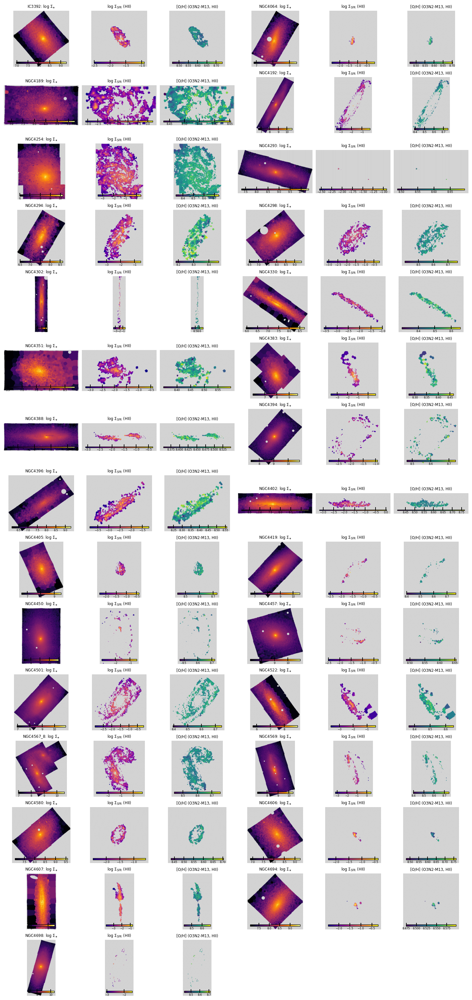

In [6]:
if old_paper_cells_ready(require_ew=True):
    # --------------------------------------------------------------
    # Maps: Σ_M*, Σ_SFR and [O/H] (O3N2-M13) maps for each galaxy
    # Using HII spaxels (common HII for Σ_SFR and O/H only)
    # Layout: dynamic rows, two 3-column galaxy blocks per row
    # Columns per row: [Σ_M*, Σ_SFR, [O/H]] × 2 blocks
    # --------------------------------------------------------------
    import math
    import numpy as np
    import matplotlib.pyplot as plt
    from matplotlib.gridspec import GridSpec
    from mpl_toolkits.axes_grid1.inset_locator import inset_axes
    from pathlib import Path
    from astropy.io import fits

    EW_FILE_SUFFIX = '_proxy_EW_maps.fits'
    EW_HDU = 'PROXY_EWHA'
    EW_MIN = 6.0


    # 0 · discover galaxies
    galaxies = physics_ready_galaxies(require_ew=True)
    ngal     = len(galaxies)
    if ngal == 0:
        print("No galaxies with mass, SFR, O/H, and EW maps are ready yet.")

    # 1 · helpers to load maps (no mask for mass; HII mask for Σ_SFR and O/H)
    def load_maps_hii(gal):
        """
        Load stellar-mass surface density (from spatial-binning file),
        Σ_SFR (HII), and [O/H] (O3N2-M13, HII) for a galaxy.

        - Σ_M* is shown wherever it is finite (no HII mask).
        - Σ_SFR and [O/H] use a common HII mask requiring both to be finite.
        """
        with fits.open(further_spatial_path(gal)) as h_bin:
            logSigmaM = h_bin['LOGMASS_SURFACE_DENSITY'].data
        with fits.open(further_gas_path(gal)) as h_gas:
            sigSFR_HII     = h_gas['LOGSFR_SURFACE_DENSITY_HII'].data
            ha_sigma_obs = h_gas['HA6562_SIGMA'].data
            ha_sigma_corr = h_gas['HA6562_SIGMA_CORR'].data if 'HA6562_SIGMA_CORR' in h_gas else None
            if ha_sigma_corr is None:
                raise KeyError(f'{gal}: missing HA6562_SIGMA_CORR in current further gas product')
            if ha_sigma_corr.shape != ha_sigma_obs.shape:
                raise ValueError(f'{gal}: shape mismatch SIGMA_CORR {ha_sigma_corr.shape} vs SIGMA {ha_sigma_obs.shape}')
            sigma2_intrinsic = ha_sigma_obs**2 - ha_sigma_corr**2
            ha_sigma = np.full_like(ha_sigma_obs, np.nan, dtype=float)
            sigma_ok = np.isfinite(sigma2_intrinsic) & (sigma2_intrinsic > 0)
            ha_sigma[sigma_ok] = np.sqrt(sigma2_intrinsic[sigma_ok])
            oh_o3n2m13_HII = h_gas['O_H_O3N2_M13_HII'].data

        ew_file = further_ew_path(gal, EW_FILE_SUFFIX)
        with fits.open(ew_file) as h_ew:
            if EW_HDU not in h_ew:
                raise KeyError(f"Missing {EW_HDU} in {ew_file}")
            ew_ha = h_ew[EW_HDU].data
        ew_ha = align_map_to_shape(ew_ha, sigSFR_HII.shape, label=f"{gal} {EW_HDU}")

        # Mass: just require Σ_M* to be finite
        mass_mask   = np.isfinite(logSigmaM)
        logSigmaM_c = np.where(mass_mask, logSigmaM, np.nan)

        # HII common mask for Σ_SFR and O/H
        hii_mask        = (np.isfinite(sigSFR_HII) & np.isfinite(oh_o3n2m13_HII) & np.isfinite(ew_ha) & (ew_ha > EW_MIN))
        hii_mask = hii_mask & np.isfinite(ha_sigma) & (ha_sigma < 45.0)
        sigSFR_HII_c    = np.where(hii_mask, sigSFR_HII, np.nan)
        oh_o3n2m13_c    = np.where(hii_mask, oh_o3n2m13_HII, np.nan)

        return logSigmaM_c, sigSFR_HII_c, oh_o3n2m13_c

    # 2 · figure & GridSpec  (two 3-column blocks per row)
    # Use constrained_layout for better handling of colorbars and spacing
    nrows = max(1, math.ceil(ngal / 2))
    fig = plt.figure(figsize=(12, max(3.0, 1.7 * nrows)), constrained_layout=True)
    gs  = GridSpec(
            nrows=nrows, ncols=6, figure=fig,
            width_ratios=[1, 1, 1, 1, 1, 1],      # [Σ_M*, Σ_SFR, [O/H]] × 2 blocks
            wspace=0.00, hspace=0.00
    )

    for idx, gal in enumerate(galaxies):
        row  = idx // 2                     # dynamic row index
        blk  = idx % 2                      # 0 or 1   (left / right 3-column block)
        col0 = blk * 3                      # 0 or 3   (start col of that block)

        logSigmaM_c, sigSFR_HII_c, oh_o3n2m13_c = load_maps_hii(gal)

        # Σ_M* map with NaN shown as light gray
        axM = fig.add_subplot(gs[row, col0])
        cmap_M = plt.cm.inferno.copy(); cmap_M.set_bad('lightgray')
        imM = axM.imshow(logSigmaM_c, origin='lower', cmap=cmap_M)
        axM.set_title(rf'{gal}: $\log\,\Sigma_{{\ast}}$', fontsize=7)
        axM.axis('off')
        caxM = inset_axes(axM, width='90%', height='3%', loc='lower center', borderpad=0.6)
        fig.colorbar(imM, cax=caxM, orientation='horizontal')
        caxM.tick_params(labelsize=5, pad=1)

        # Σ_SFR (HII) map with NaN shown as light gray
        axS = fig.add_subplot(gs[row, col0+1])
        cmap_S = plt.cm.plasma.copy(); cmap_S.set_bad('lightgray')
        imS = axS.imshow(sigSFR_HII_c, origin='lower', cmap=cmap_S)
        axS.set_title(r'$\log\,\Sigma_{\mathrm{SFR}}$ (HII)', fontsize=7)
        axS.axis('off')
        caxS = inset_axes(axS, width='90%', height='3%', loc='lower center', borderpad=0.6)
        fig.colorbar(imS, cax=caxS, orientation='horizontal')
        caxS.tick_params(labelsize=5, pad=1)

        # [O/H] O3N2-M13 (HII) map with NaN shown as light gray
        axOH = fig.add_subplot(gs[row, col0+2])
        cmap_OH = plt.cm.viridis.copy(); cmap_OH.set_bad('lightgray')
        imOH = axOH.imshow(oh_o3n2m13_c, origin='lower', cmap=cmap_OH)
        axOH.set_title(r'[O/H] (O3N2-M13, HII)', fontsize=7)
        axOH.axis('off')
        caxOH = inset_axes(axOH, width='90%', height='3%', loc='lower center', borderpad=0.6)
        fig.colorbar(imOH, cax=caxOH, orientation='horizontal')
        caxOH.tick_params(labelsize=5, pad=1)

    # Save figure in both PNG and PDF formats
    # Add a little extra space below plots via pad_inches
    # fig.savefig('Plot_Paper_1/MAUVE_MUSE_SigmaM_SigmaSFR_OH_Maps_HII_6x7_EW.png', dpi=600, bbox_inches='tight', pad_inches=0.05)
    # fig.savefig('Plot_Paper_1/MAUVE_MUSE_SigmaM_SigmaSFR_OH_Maps_HII_6x7_EW.pdf', dpi=600, pad_inches=0.05)

    plt.show()
else:
    print("Skipped copied previous-project analysis cell 4: no nested *_further mass/SFR/OH+EW products are ready yet.")


## Deprojected radial profiles

This section tests radial profiles for the current `further` products using one radial coordinate per spaxel.

For each galaxy, the projected spaxel coordinate is taken from the 2-D map index: `x = column`, `y = row`. The center is read from `cube_centers_v3tk.csv` using the `center_x` and `center_y` columns. The angular-to-physical conversion is

```text
0.2 arcsec / pixel * 16.5 Mpc * 1000 kpc/Mpc / 206265 arcsec/radian = 0.015997 kpc / pixel
```

The inclination correction follows the finite-thickness convention used by `SFR+Z.py` and `Mass.py`:

```text
b/a = sqrt((1 - q0^2) * cos(i)^2 + q0^2), with q0 = 0.2
```

The disk-plane radius uses both inclination and position angle. Inclination is read from `MAUVE_Inclination.dat`, while PA is read from the last column of `Brown2021Table1.txt`; table names such as `NGC 4189` are normalized to the product IDs such as `NGC4189`. The code rotates image offsets into projected major/minor-axis coordinates and applies the same finite-thickness `b/a` convention used by the local surface-density products:

```text
x_major = dx * sin(PA) + dy * cos(PA)
y_minor = dx * cos(PA) - dy * sin(PA)
R_kpc = sqrt(x_major^2 + (y_minor / (b/a))^2) * 0.015997
```

If a galaxy is missing from `Brown2021Table1.txt`, the code falls back to the inclination-corrected equivalent circular radius and records `pa_deg = NaN` for that galaxy.

The profile bins are in physical kpc. For each bin, the notebook records the number of finite HII SFR spaxels and the mean, median, 16th percentile, and 84th percentile of: stellar mass surface density, HII SFR surface density, and HII oxygen abundance from O3N2-M13, O3N2-C20, D16, and PG16.

For stellar mass and HII SFR surface density, the notebook also fits exponential profiles,

```text
Sigma_*(R) = Sigma_0 exp(-R / R_*)
Sigma_SFR(R) = Sigma_0 exp(-R / R_SFR)
```

The FITS products are already stored as log10 surface densities, so the fitted model is evaluated as a straight line in log-space:

```text
log10 Sigma(R) = log10 Sigma_0 - R / (R_scale ln 10)
```

The dotted curves in the profile plots show this fitted exponential model, and the fitted `log10 Sigma_0` and scale length in kpc are reported in tables.

In [7]:
# Radial-profile configuration and geometry helpers.
from __future__ import annotations

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from astropy.io import fits

CENTER_TABLE_PATH = PROJECT_ROOT / "cube_centers_v3tk.csv"
INCLINATION_TABLE_PATH = PROJECT_ROOT / "MAUVE_Inclination.dat"
PA_TABLE_PATH = PROJECT_ROOT / "Brown2021Table1.txt"
PIXEL_SCALE_ARCSEC = 0.2
VIRGO_DISTANCE_MPC = 16.5
KPC_PER_PIXEL = PIXEL_SCALE_ARCSEC * VIRGO_DISTANCE_MPC * 1000.0 / 206265.0
FINITE_THICKNESS_Q0 = 0.2
RADIAL_BIN_WIDTH_KPC = 0.25

def read_position_angles(path: Path = PA_TABLE_PATH) -> dict[str, float]:
    pas: dict[str, float] = {}
    with open(path) as handle:
        for line in handle:
            parts = line.split()
            if len(parts) < 2 or parts[0].startswith("#"):
                continue
            if parts[0].upper() in {"IC", "NGC", "VCC"} and parts[1].isdigit():
                galaxy = f"{parts[0]}{parts[1]}".upper()
            else:
                galaxy = parts[0].upper()
            try:
                pa = float(parts[-1])
            except ValueError:
                continue
            pas[galaxy] = pa
    if "NGC4567" in pas and "NGC4568" in pas:
        pas["NGC4567_8"] = float(np.nanmean([pas["NGC4567"], pas["NGC4568"]]))
    return pas

RADIAL_QUANTITIES = {
    "logMstar_surface_density": {
        "path_column": "spatial_path",
        "hdu": "LOGMASS_SURFACE_DENSITY",
        "label": "log Sigma_*",
        "ylabel": "log Sigma_*",
    },
    "logSFR_surface_density_HII": {
        "path_column": "gas_path",
        "hdu": "LOGSFR_SURFACE_DENSITY_HII",
        "label": "log Sigma_SFR HII",
        "ylabel": "log Sigma_SFR,HII",
    },
    "log_sSFR_HII": {
        "derived_from": ("logSFR_surface_density_HII", "logMstar_surface_density"),
        "label": "log sSFR HII",
        "ylabel": "log sSFR,HII",
    },
    "O_H_O3N2_M13_HII": {
        "path_column": "gas_path",
        "hdu": "O_H_O3N2_M13_HII",
        "label": "O3N2-M13 HII",
        "ylabel": "12 + log(O/H)",
    },
    "O_H_O3N2_C20_HII": {
        "path_column": "gas_path",
        "hdu": "O_H_O3N2_C20_HII",
        "label": "O3N2-C20 HII",
        "ylabel": "12 + log(O/H)",
    },
    "O_H_D16_HII": {
        "path_column": "gas_path",
        "hdu": "O_H_D16_HII",
        "label": "D16 HII",
        "ylabel": "12 + log(O/H)",
    },
    "O_H_PG16_HII": {
        "path_column": "gas_path",
        "hdu": "O_H_PG16_HII",
        "label": "PG16 HII",
        "ylabel": "12 + log(O/H)",
    },
}


def read_centers(path: Path = CENTER_TABLE_PATH) -> pd.DataFrame:
    centers = pd.read_csv(path)
    required = {"ID", "center_y", "center_x"}
    missing = required - set(centers.columns)
    if missing:
        raise ValueError(f"Missing center-table columns: {sorted(missing)}")
    centers["ID"] = centers["ID"].astype(str)
    return centers.set_index("ID", drop=False)


def read_inclinations(path: Path = INCLINATION_TABLE_PATH) -> dict[str, float]:
    inclinations: dict[str, float] = {}
    with open(path) as handle:
        for line in handle:
            parts = line.split()
            if len(parts) == 2:
                inclinations[parts[0].upper()] = float(parts[1])
    return inclinations


def ba_from_inclination(inclination_deg: float | None, q0: float = FINITE_THICKNESS_Q0) -> float:
    if inclination_deg is None or not np.isfinite(inclination_deg):
        return 1.0
    cos_i = np.cos(np.deg2rad(inclination_deg))
    return float(np.abs(np.sqrt((1.0 - q0**2) * cos_i**2 + q0**2)))


def radius_grid_kpc(
    shape: tuple[int, int],
    center_y: float,
    center_x: float,
    inclination_deg: float | None,
    pa_deg: float | None = None,
) -> np.ndarray:
    yy, xx = np.indices(shape, dtype=float)
    dx = xx - float(center_x)
    dy = yy - float(center_y)
    ba = ba_from_inclination(inclination_deg)

    if pa_deg is None:
        radius_pix = np.sqrt(dx**2 + dy**2) / np.sqrt(ba)
    else:
        theta = np.deg2rad(pa_deg)
        x_major = dx * np.sin(theta) + dy * np.cos(theta)
        y_minor = dx * np.cos(theta) - dy * np.sin(theta)
        radius_pix = np.sqrt(x_major**2 + (y_minor / ba)**2)

    return radius_pix * KPC_PER_PIXEL


CENTERS = read_centers()
INCLINATIONS = read_inclinations()
GALAXY_PA_DEG = read_position_angles()
print(f"kpc per pixel: {KPC_PER_PIXEL:.6f}")
print(f"Loaded centers for {len(CENTERS)} galaxies, inclinations for {len(INCLINATIONS)} galaxies, and PAs for {len(GALAXY_PA_DEG)} galaxies.")

kpc per pixel: 0.015999
Loaded centers for 31 galaxies, inclinations for 40 galaxies, and PAs for 53 galaxies.


In [8]:
# Build binned radial profiles for one galaxy.
def finite_data_from_hdu(path: Path, hdu_name: str) -> np.ndarray:
    with fits.open(path, memmap=False) as hdul:
        if hdu_name not in hdul:
            raise KeyError(f"{path} has no HDU named {hdu_name}")
        return np.asarray(hdul[hdu_name].data, dtype=float)


def one_quantity_profile(radius_kpc: np.ndarray, values: np.ndarray, bins: np.ndarray) -> pd.DataFrame:
    radius = np.asarray(radius_kpc, dtype=float)
    values = np.asarray(values, dtype=float)
    valid = np.isfinite(radius) & np.isfinite(values)
    bin_index = np.digitize(radius[valid], bins) - 1
    rows = []
    for i in range(len(bins) - 1):
        in_bin = bin_index == i
        vals = values[valid][in_bin]
        if vals.size:
            rows.append({
                "bin": i,
                "r_min_kpc": bins[i],
                "r_max_kpc": bins[i + 1],
                "r_mid_kpc": 0.5 * (bins[i] + bins[i + 1]),
                "n": int(vals.size),
                "mean": float(np.nanmean(vals)),
                "median": float(np.nanmedian(vals)),
                "p16": float(np.nanpercentile(vals, 16)),
                "p84": float(np.nanpercentile(vals, 84)),
            })
        else:
            rows.append({
                "bin": i,
                "r_min_kpc": bins[i],
                "r_max_kpc": bins[i + 1],
                "r_mid_kpc": 0.5 * (bins[i] + bins[i + 1]),
                "n": 0,
                "mean": np.nan,
                "median": np.nan,
                "p16": np.nan,
                "p84": np.nan,
            })
    return pd.DataFrame(rows)


def galaxy_radial_profile(galaxy: str, bin_width_kpc: float = RADIAL_BIN_WIDTH_KPC) -> pd.DataFrame:
    if galaxy not in PRODUCTS.index:
        raise KeyError(f"{galaxy} is not in PRODUCTS")
    if galaxy not in CENTERS.index:
        raise KeyError(f"{galaxy} is not in {CENTER_TABLE_PATH.name}")

    product_row = PRODUCTS.loc[galaxy]
    center = CENTERS.loc[galaxy]
    inclination_deg = INCLINATIONS.get(galaxy.upper())
    pa_deg = GALAXY_PA_DEG.get(galaxy)

    loaded = {}
    radii = {}
    max_radius = 0.0
    for quantity, spec in RADIAL_QUANTITIES.items():
        if "derived_from" in spec:
            continue
        path = Path(product_row[spec["path_column"]])
        data = finite_data_from_hdu(path, spec["hdu"])
        loaded[quantity] = data
        radius = radius_grid_kpc(data.shape, center.center_y, center.center_x, inclination_deg, pa_deg)
        radii[quantity] = radius
        finite_radius = radius[np.isfinite(radius) & np.isfinite(data)]
        if finite_radius.size:
            max_radius = max(max_radius, float(np.nanmax(finite_radius)))

    for quantity, spec in RADIAL_QUANTITIES.items():
        if "derived_from" in spec:
            q1, q2 = spec["derived_from"]
            if q1 in loaded and q2 in loaded:
                data = loaded[q1] - loaded[q2]
                loaded[quantity] = data
                radii[quantity] = radii[q1]
                finite_radius = radii[quantity][np.isfinite(radii[quantity]) & np.isfinite(data)]
                if finite_radius.size:
                    max_radius = max(max_radius, float(np.nanmax(finite_radius)))

    if max_radius <= 0:
        raise ValueError(f"No finite profile radius for {galaxy}")

    bins = np.arange(0.0, max_radius + bin_width_kpc, bin_width_kpc)
    if bins.size < 2:
        bins = np.array([0.0, bin_width_kpc])

    pieces = []
    for quantity, data in loaded.items():
        prof = one_quantity_profile(radii[quantity], data, bins)
        rename = {
            "n": f"{quantity}_n",
            "mean": f"{quantity}_mean",
            "median": f"{quantity}_median",
            "p16": f"{quantity}_p16",
            "p84": f"{quantity}_p84",
        }
        prof = prof.rename(columns=rename)
        keep = ["bin", "r_min_kpc", "r_max_kpc", "r_mid_kpc"] + list(rename.values())
        pieces.append(prof[keep])

    profile = pieces[0]
    for piece in pieces[1:]:
        profile = profile.merge(piece, on=["bin", "r_min_kpc", "r_max_kpc", "r_mid_kpc"], how="outer")
    profile.insert(0, "galaxy", galaxy)
    profile.insert(1, "inclination_deg", inclination_deg)
    profile.insert(2, "ba_factor", ba_from_inclination(inclination_deg))
    profile.insert(3, "pa_deg", pa_deg if pa_deg is not None else np.nan)
    profile["n_hii_spaxels"] = profile["logSFR_surface_density_HII_n"]
    return profile.sort_values("r_mid_kpc").reset_index(drop=True)


RADIAL_PROFILES = {
    gal: galaxy_radial_profile(gal)
    for gal in ANALYSIS_GALAXIES
    if gal in CENTERS.index
}
print(f"Built radial profiles for {len(RADIAL_PROFILES)} galaxies.")
if RADIAL_PROFILES:
    display(next(iter(RADIAL_PROFILES.values())).head())

Built radial profiles for 29 galaxies.


,galaxy,inclination_deg,ba_factor,pa_deg,bin,r_min_kpc,r_max_kpc,r_mid_kpc,logMstar_surface_density_n,logMstar_surface_density_mean,...,O_H_PG16_HII_mean,O_H_PG16_HII_median,O_H_PG16_HII_p16,O_H_PG16_HII_p84,log_sSFR_HII_n,log_sSFR_HII_mean,log_sSFR_HII_median,log_sSFR_HII_p16,log_sSFR_HII_p84,n_hii_spaxels
0,IC3392,68.0,0.417992,219.0,0,0.00,0.25,0.125,317,8.699487,...,8.569384,8.566421,8.545741,8.595500,293,-10.319377,-10.325957,-10.498654,-10.102970,293
1,IC3392,68.0,0.417992,219.0,1,0.25,0.50,0.375,960,8.600440,...,8.577128,8.574647,8.543891,8.611433,886,-10.315724,-10.363154,-10.581224,-10.051870,886
2,IC3392,68.0,0.417992,219.0,2,0.50,0.75,0.625,1612,8.417352,...,8.562409,8.557946,8.530645,8.597424,1170,-10.219561,-10.235622,-10.453283,-9.986461,1170
3,IC3392,68.0,0.417992,219.0,3,0.75,1.00,0.875,2242,8.275306,...,8.551068,8.549424,8.524345,8.578461,1482,-10.289785,-10.273022,-10.561679,-10.056130,1482
4,IC3392,68.0,0.417992,219.0,4,1.00,1.25,1.125,2890,8.182256,...,8.551456,8.548322,8.522826,8.582483,1374,-10.320696,-10.329929,-10.607878,-10.026864,1374


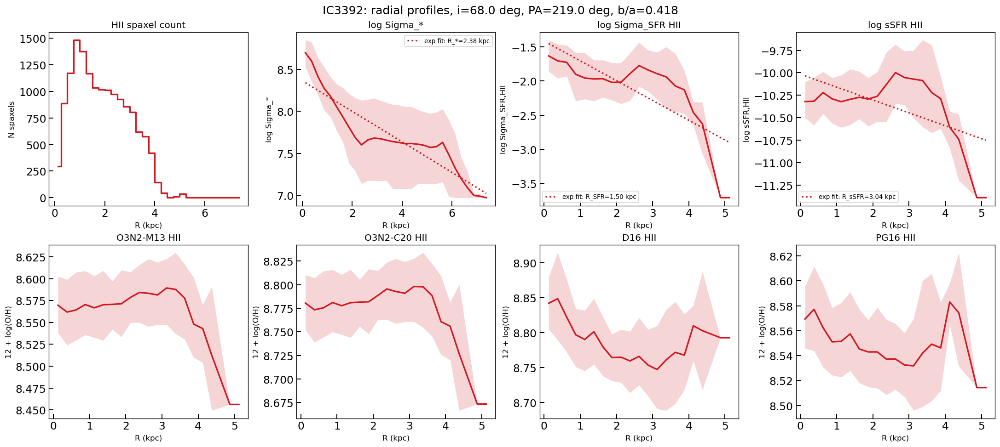

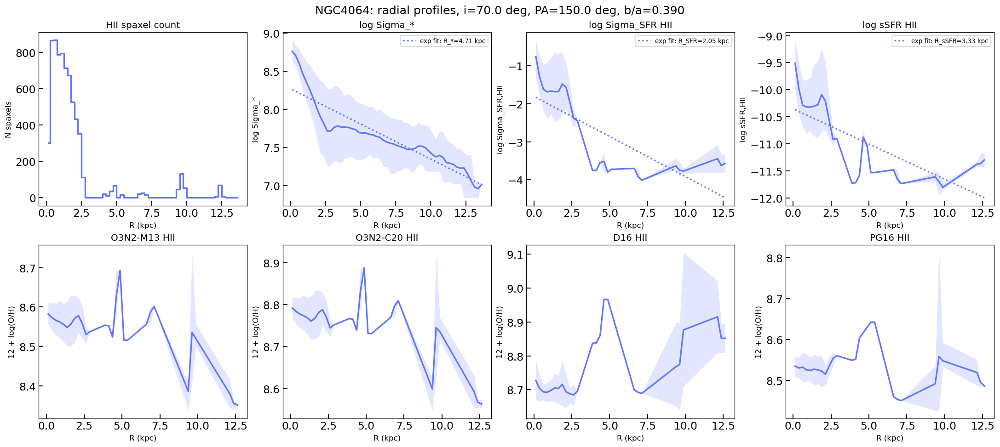

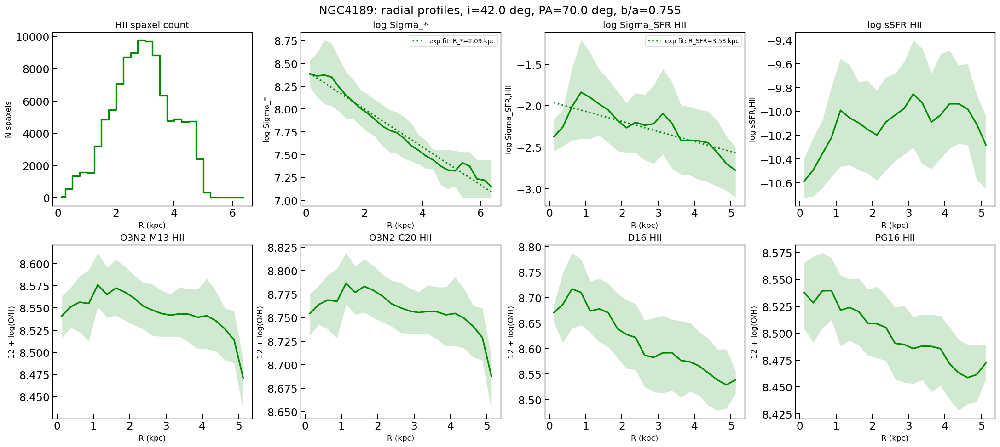

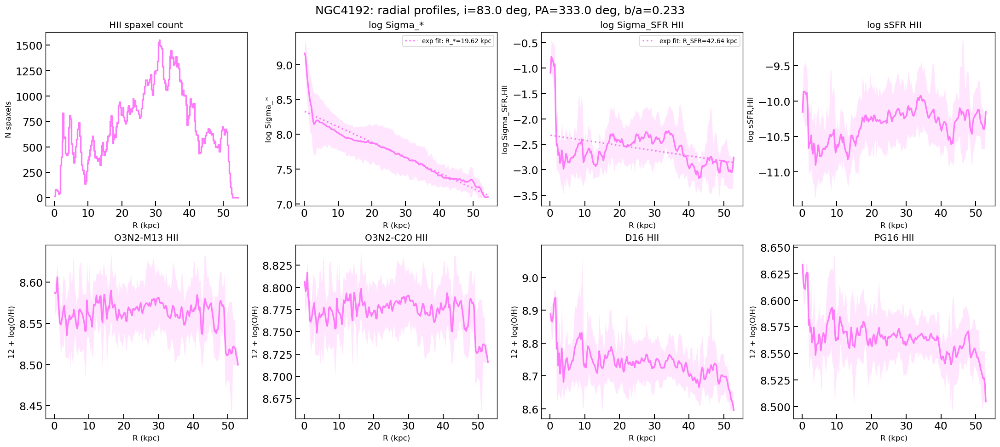

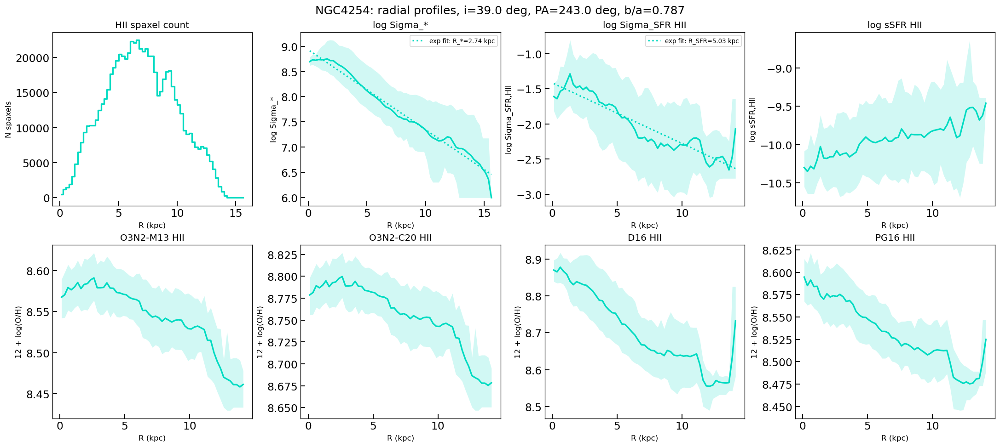

...

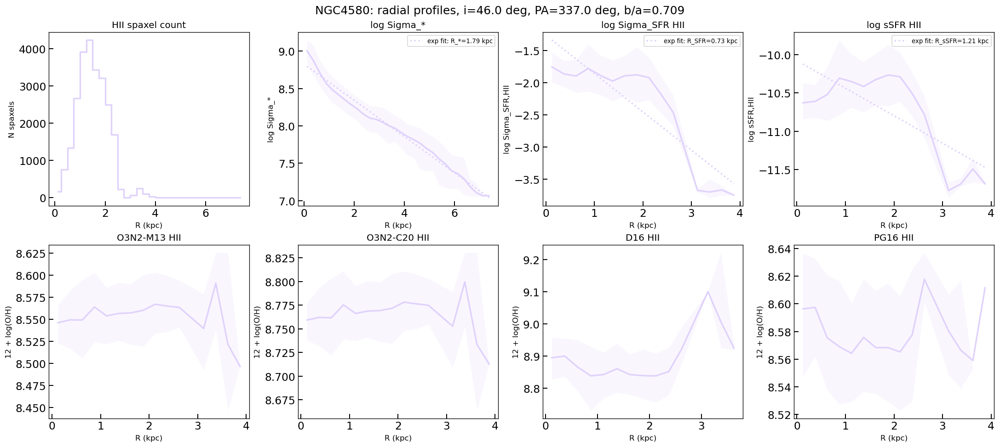

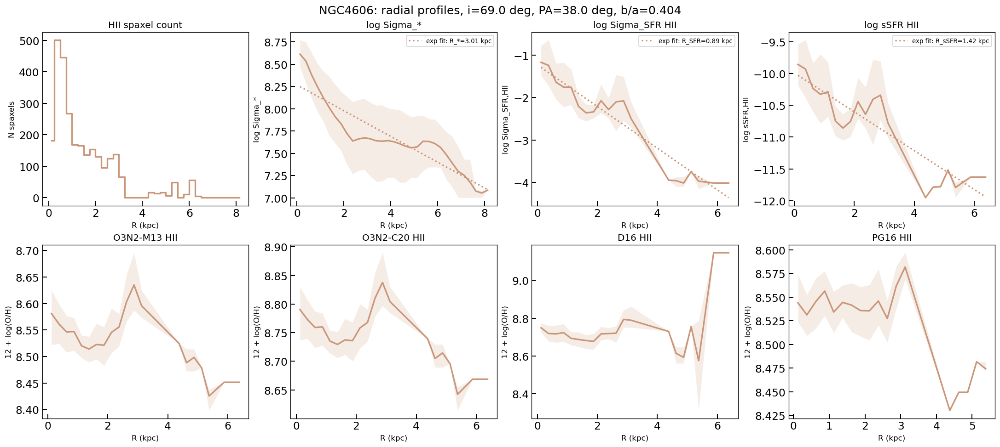

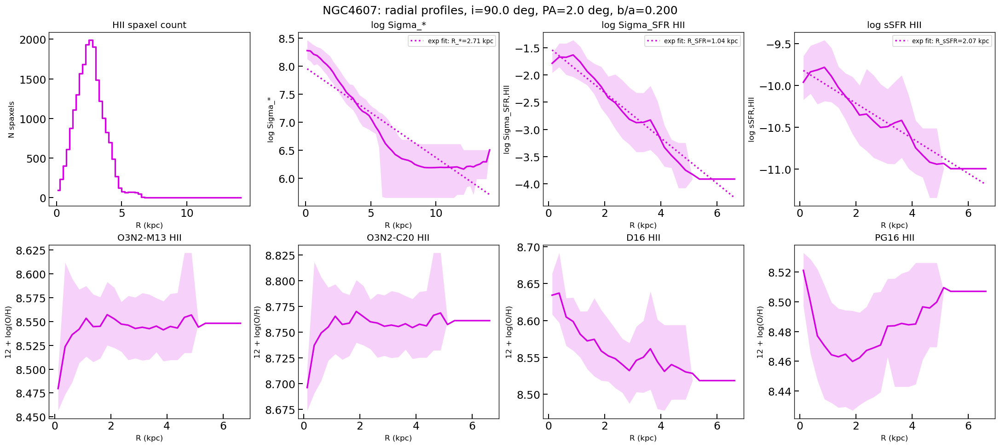

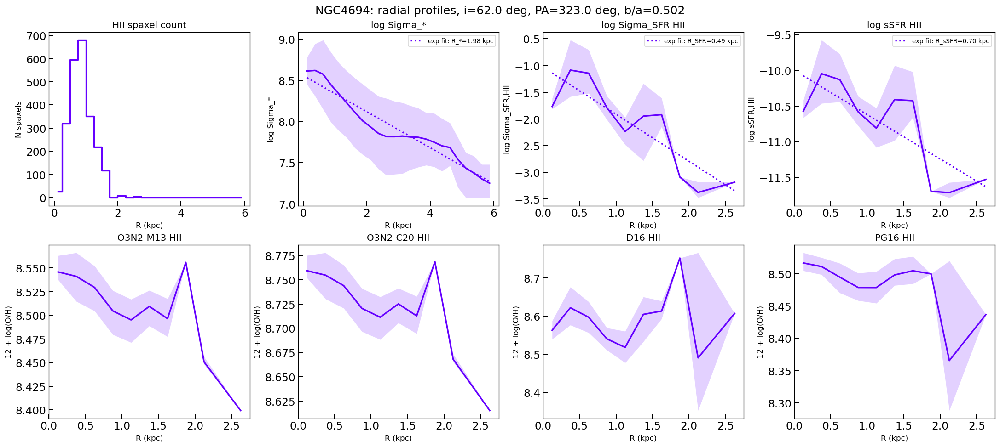

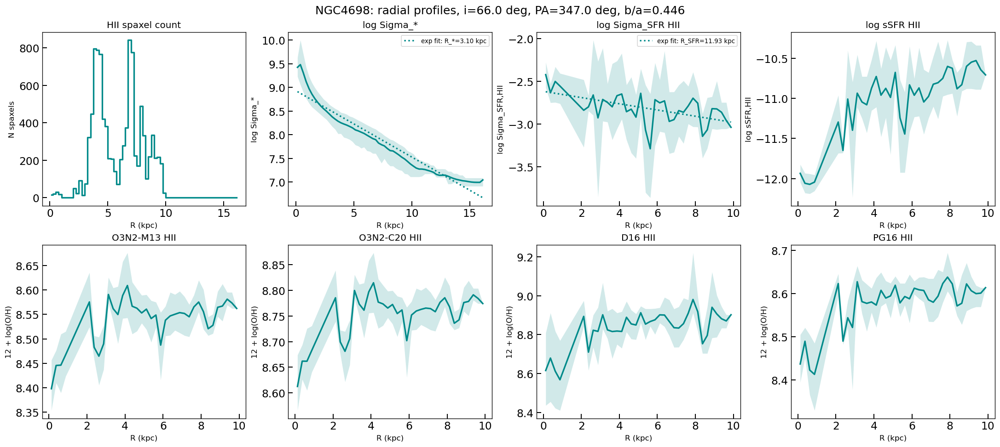

,galaxy,quantity,log10_sigma0,scale_length_kpc,slope,n_bins_fit
0,IC3392,logMstar_surface_density,8.365311,2.382074,-0.182318,30
1,IC3392,logSFR_surface_density_HII,-1.415211,1.497407,-0.290031,20
2,IC3392,log_sSFR_HII,-10.016125,3.035302,-0.143081,20
3,NGC4064,logMstar_surface_density,8.269906,4.714223,-0.092124,55
4,NGC4064,logSFR_surface_density_HII,-1.800814,2.051992,-0.211645,28
...,...,...,...,...,...,...
82,NGC4694,logSFR_surface_density_HII,-1.031993,0.492873,-0.881149,10
83,NGC4694,log_sSFR_HII,-10.001409,0.699743,-0.620648,10
84,NGC4698,logMstar_surface_density,8.927889,3.102240,-0.139994,65
85,NGC4698,logSFR_surface_density_HII,-2.617109,11.932489,-0.036396,36


In [9]:
# Plot radial profiles for each galaxy.
EXPONENTIAL_FIT_QUANTITIES = {
    "logMstar_surface_density": "R_*",
    "logSFR_surface_density_HII": "R_SFR",
    "log_sSFR_HII": "R_sSFR",
}


def fit_exponential_log_profile(profile: pd.DataFrame, quantity: str, min_points: int = 4) -> dict[str, float | str]:
    x = profile["r_mid_kpc"].to_numpy(dtype=float)
    y = profile[f"{quantity}_mean"].to_numpy(dtype=float)
    n = profile[f"{quantity}_n"].to_numpy(dtype=float)
    valid = np.isfinite(x) & np.isfinite(y) & (n > 0)
    if np.count_nonzero(valid) < min_points:
        return {
            "quantity": quantity,
            "log10_sigma0": np.nan,
            "scale_length_kpc": np.nan,
            "slope": np.nan,
            "n_bins_fit": int(np.count_nonzero(valid)),
        }

    slope, intercept = np.polyfit(x[valid], y[valid], deg=1)
    scale_length = -1.0 / (slope * np.log(10.0)) if slope < 0 else np.nan
    return {
        "quantity": quantity,
        "log10_sigma0": float(intercept),
        "scale_length_kpc": float(scale_length),
        "slope": float(slope),
        "n_bins_fit": int(np.count_nonzero(valid)),
    }


def add_exponential_fit_curve(ax, profile: pd.DataFrame, quantity: str, color: str) -> dict[str, float | str] | None:
    if quantity not in EXPONENTIAL_FIT_QUANTITIES:
        return None

    fit = fit_exponential_log_profile(profile, quantity)
    if np.isfinite(fit["log10_sigma0"]) and np.isfinite(fit["scale_length_kpc"]):
        x = profile["r_mid_kpc"].to_numpy(dtype=float)
        y = profile[f"{quantity}_mean"].to_numpy(dtype=float)
        valid = np.isfinite(x) & np.isfinite(y)
        x_fit = np.linspace(np.nanmin(x[valid]), np.nanmax(x[valid]), 200)
        y_fit = fit["log10_sigma0"] + fit["slope"] * x_fit
        label = f"exp fit: {EXPONENTIAL_FIT_QUANTITIES[quantity]}={fit['scale_length_kpc']:.2f} kpc"
        ax.plot(x_fit, y_fit, color=color, lw=2, ls=":", label=label)
        ax.legend(fontsize=8)
    return fit


def plot_single_galaxy_radial_profile(galaxy: str, profile: pd.DataFrame) -> tuple[plt.Figure, list[dict[str, float | str]]]:
    fig, axes = plt.subplots(2, 4, figsize=(18, 8), constrained_layout=True)
    axes = axes.ravel()
    color = galaxy_color(galaxy)
    fit_rows = []

    ax = axes[0]
    ax.step(profile["r_mid_kpc"], profile["n_hii_spaxels"], where="mid", color=color, lw=2)
    ax.set_title("HII spaxel count")
    ax.set_xlabel("R (kpc)")
    ax.set_ylabel("N spaxels")

    for ax, (quantity, spec) in zip(axes[1:], RADIAL_QUANTITIES.items()):
        x = profile["r_mid_kpc"].to_numpy()
        mean = profile[f"{quantity}_mean"].to_numpy()
        p16 = profile[f"{quantity}_p16"].to_numpy()
        p84 = profile[f"{quantity}_p84"].to_numpy()
        valid = np.isfinite(x) & np.isfinite(mean)
        ax.plot(x[valid], mean[valid], color=color, lw=2)
        band = valid & np.isfinite(p16) & np.isfinite(p84)
        ax.fill_between(x[band], p16[band], p84[band], color=color, alpha=0.18, linewidth=0)
        fit = add_exponential_fit_curve(ax, profile, quantity, color)
        if fit is not None:
            fit_rows.append({"galaxy": galaxy, **fit})
        ax.set_title(spec["label"])
        ax.set_xlabel("R (kpc)")
        ax.set_ylabel(spec["ylabel"])

    # axes[-1].axis("off")
    fig.suptitle(
        f"{galaxy}: radial profiles, i={profile['inclination_deg'].iloc[0]} deg, "
        f"PA={profile['pa_deg'].iloc[0]} deg, b/a={profile['ba_factor'].iloc[0]:.3f}",
        fontsize=15,
    )
    return fig, fit_rows


GALAXY_EXPONENTIAL_FITS = []
for galaxy, profile in RADIAL_PROFILES.items():
    fig, fit_rows = plot_single_galaxy_radial_profile(galaxy, profile)
    GALAXY_EXPONENTIAL_FITS.extend(fit_rows)
    plt.show()

GALAXY_EXPONENTIAL_FITS = pd.DataFrame(GALAXY_EXPONENTIAL_FITS)
display(GALAXY_EXPONENTIAL_FITS)


## Ensemble radial profile

The ensemble profile below pools finite spaxels from all science-ready galaxies into the same physical radial bins. This is a direct spaxel-level ensemble, not an average of already binned galaxy profiles. The count panel therefore reports the total number of finite HII SFR spaxels in each radial bin across the sample.

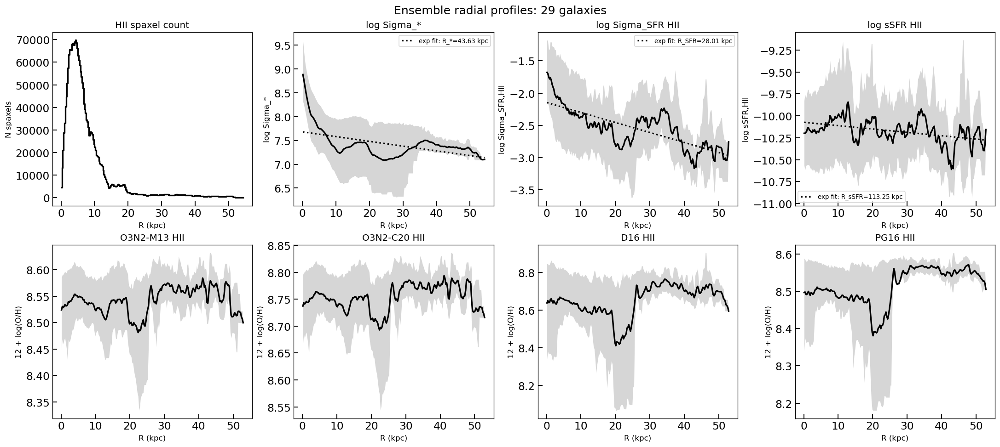

,sample,quantity,log10_sigma0,scale_length_kpc,slope,n_bins_fit
0,ensemble,logMstar_surface_density,7.679570,43.630662,-0.009954,218
1,ensemble,logSFR_surface_density_HII,-2.145926,28.010909,-0.015504,212
2,ensemble,log_sSFR_HII,-10.072980,113.245527,-0.003835,212


{'logMstar_surface_density':    bin  r_min_kpc  r_max_kpc  r_mid_kpc      n      mean    median       p16  \
 0    0       0.00       0.25      0.125  10837  8.882471  8.712608  8.323098   
 1    1       0.25       0.50      0.375  32460  8.790552  8.698337  8.260865   
 2    2       0.50       0.75      0.625  54054  8.681031  8.642501  8.175800   
 3    3       0.75       1.00      0.875  75478  8.574835  8.565663  8.087822   
 4    4       1.00       1.25      1.125  96898  8.472975  8.477445  7.999117   
 
         p84  
 0  9.605849  
 1  9.416172  
 2  9.230975  
 3  9.085972  
 4  8.985322  ,
 'logSFR_surface_density_HII':    bin  r_min_kpc  r_max_kpc  r_mid_kpc      n      mean    median       p16  \
 0    0       0.00       0.25      0.125   4448 -1.677524 -1.721227 -2.149474   
 1    1       0.25       0.50      0.375  13366 -1.696160 -1.745958 -2.155013   
 2    2       0.50       0.75      0.625  21063 -1.747759 -1.771126 -2.198204   
 3    3       0.75       1.00      0.87

In [10]:
# Build and plot ensemble profiles by pooling all finite spaxels.
def quantity_values_for_galaxy(galaxy: str, quantity: str) -> pd.DataFrame:
    spec = RADIAL_QUANTITIES[quantity]
    product_row = PRODUCTS.loc[galaxy]
    center = CENTERS.loc[galaxy]
    inclination_deg = INCLINATIONS.get(galaxy.upper())
    pa_deg = GALAXY_PA_DEG.get(galaxy)

    if "derived_from" in spec:
        q1, q2 = spec["derived_from"]
        spec1 = RADIAL_QUANTITIES[q1]
        spec2 = RADIAL_QUANTITIES[q2]
        data1 = finite_data_from_hdu(Path(product_row[spec1["path_column"]]), spec1["hdu"])
        data2 = finite_data_from_hdu(Path(product_row[spec2["path_column"]]), spec2["hdu"])
        data = data1 - data2
        radius = radius_grid_kpc(data1.shape, center.center_y, center.center_x, inclination_deg, pa_deg)
    else:
        data = finite_data_from_hdu(Path(product_row[spec["path_column"]]), spec["hdu"])
        radius = radius_grid_kpc(data.shape, center.center_y, center.center_x, inclination_deg, pa_deg)

    valid = np.isfinite(radius) & np.isfinite(data)
    return pd.DataFrame({
        "galaxy": galaxy,
        "r_kpc": radius[valid].ravel(),
        "value": data[valid].ravel(),
    })


def ensemble_quantity_profile(quantity: str, bins: np.ndarray) -> pd.DataFrame:
    tables = [quantity_values_for_galaxy(gal, quantity) for gal in RADIAL_PROFILES]
    if not tables:
        raise RuntimeError("No radial profiles are available for ensemble plotting")
    values = pd.concat(tables, ignore_index=True)
    return one_quantity_profile(values["r_kpc"].to_numpy(), values["value"].to_numpy(), bins)


max_r = max(float(profile["r_mid_kpc"].max()) for profile in RADIAL_PROFILES.values())
ENSEMBLE_BINS = np.arange(0.0, max_r + RADIAL_BIN_WIDTH_KPC, RADIAL_BIN_WIDTH_KPC)
ENSEMBLE_PROFILES = {quantity: ensemble_quantity_profile(quantity, ENSEMBLE_BINS) for quantity in RADIAL_QUANTITIES}

fig, axes = plt.subplots(2, 4, figsize=(18, 8), constrained_layout=True)
axes = axes.ravel()
ENSEMBLE_EXPONENTIAL_FITS = []

count_profile = ENSEMBLE_PROFILES["logSFR_surface_density_HII"]
axes[0].step(count_profile["r_mid_kpc"], count_profile["n"], where="mid", color="black", lw=2)
axes[0].set_title("HII spaxel count")
axes[0].set_xlabel("R (kpc)")
axes[0].set_ylabel("N spaxels")

for ax, (quantity, spec) in zip(axes[1:], RADIAL_QUANTITIES.items()):
    prof = ENSEMBLE_PROFILES[quantity]
    x = prof["r_mid_kpc"].to_numpy()
    mean = prof["mean"].to_numpy()
    p16 = prof["p16"].to_numpy()
    p84 = prof["p84"].to_numpy()
    valid = np.isfinite(x) & np.isfinite(mean)
    ax.plot(x[valid], mean[valid], color="black", lw=2)
    band = valid & np.isfinite(p16) & np.isfinite(p84)
    ax.fill_between(x[band], p16[band], p84[band], color="black", alpha=0.16, linewidth=0)
    fit_profile = prof.rename(columns={
        "n": f"{quantity}_n",
        "mean": f"{quantity}_mean",
        "p16": f"{quantity}_p16",
        "p84": f"{quantity}_p84",
    })
    fit = add_exponential_fit_curve(ax, fit_profile, quantity, "black")
    if fit is not None:
        ENSEMBLE_EXPONENTIAL_FITS.append({"sample": "ensemble", **fit})
    ax.set_title(spec["label"])
    ax.set_xlabel("R (kpc)")
    ax.set_ylabel(spec["ylabel"])

# axes[-1].axis("off")
fig.suptitle(f"Ensemble radial profiles: {len(RADIAL_PROFILES)} galaxies", fontsize=15)
plt.show()

ENSEMBLE_EXPONENTIAL_FITS = pd.DataFrame(ENSEMBLE_EXPONENTIAL_FITS)
display(ENSEMBLE_EXPONENTIAL_FITS)
display({quantity: profile.head() for quantity, profile in ENSEMBLE_PROFILES.items()})
